In [87]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from scipy.spatial import distance
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [2]:
from IPython.display import set_matplotlib_formats, display, Latex
set_matplotlib_formats('svg','pdf')

In [3]:
from my_plot import *

In [4]:
sns.set_style('whitegrid')

In [5]:
mean = [0, 0]
mean2 = [6, 8]
cov = [[7, 0], [0, 7]]

In [6]:
train_size = 800
test_size = 200
group1_train = np.random.multivariate_normal(mean, cov, train_size)
group1_test = np.random.multivariate_normal(mean, cov, test_size)
group2_train = np.random.multivariate_normal(mean2, cov, train_size)
group2_test = np.random.multivariate_normal(mean2, cov, test_size)
X_train = np.concatenate((group1_train, group2_train))
Y_train = np.concatenate((np.zeros((train_size,), dtype=int), np.ones((train_size,), dtype=int)))
X_test = np.concatenate((group1_test, group2_test))
Y_test = np.concatenate((np.zeros((test_size,), dtype=int), np.ones((test_size,), dtype=int)))

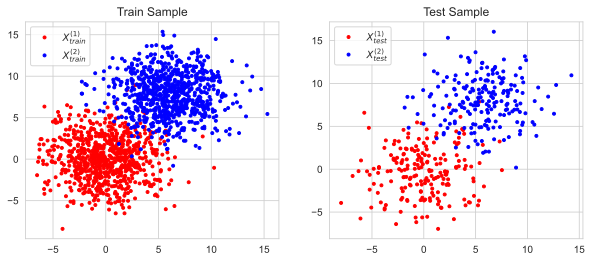

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
test_vec1_x, test_vec1_y = group1_test.T
test_vec2_x, test_vec2_y = group2_test.T
train_vec1_x, train_vec1_y = group1_train.T
train_vec2_x, train_vec2_y = group2_train.T
ax1.plot(train_vec1_x, train_vec1_y, 'r.', label='$X^{(1)}_{train}$')
ax1.plot(train_vec2_x, train_vec2_y, 'b.', label='$X^{(2)}_{train}$')
ax1.set_title('Train Sample')
ax1.legend()
ax2.plot(test_vec1_x, test_vec1_y, 'r.', label='$X^{(1)}_{test}$')
ax2.plot(test_vec2_x, test_vec2_y, 'b.', label='$X^{(2)}_{test}$')
ax2.set_title('Test Sample')
ax2.legend()
plt.show()
fig.savefig("Samples.pdf")

In [8]:
clf = LinearDiscriminantAnalysis(store_covariance=True)
clf.fit(X_train, Y_train)
predictions = clf.predict(X_test)
predictions_train_sample = clf.predict(X_train)

Результаты теста:

In [9]:
plot_data(clf, X_test, Y_test, predictions, "test_plots.pdf")

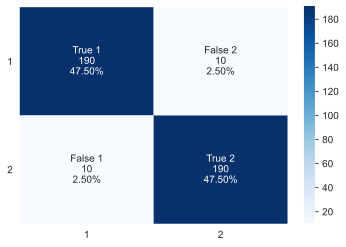

In [10]:
CM = confusion_matrix(Y_test, predictions)
display_confusion_matrix(CM, "test_heat.pdf")

In [11]:
df_m = calculate_metrics(CM)
print_metrics_to_file(df_m, 'test_metrics.tex')
display(df_m)

,metrics,value
0,Accuracy,0.95


Проверка обучающей выборки:

In [12]:
plot_data(clf, X_train, Y_train, predictions_train_sample, "train_plots.pdf")

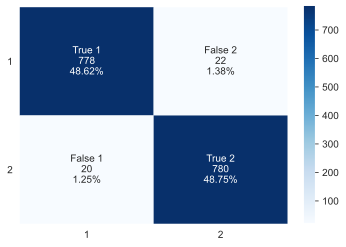

In [14]:
CM2 = confusion_matrix(Y_train, predictions_train_sample)
display_confusion_matrix(CM2, "train_heat.pdf")

In [15]:
df_m2 = calculate_metrics(CM2)
print_metrics_to_file(df_m2, 'train_metrics.tex')
display(df_m2)

,metrics,value
0,Accuracy,0.97375


Расстояние Махалонобиса: $D=\sqrt{\left(\overline{z}_1-\overline{z}_2\right)^T\displaystyle S_z^{-1} \left(\overline{z}_1-\overline{z}_2\right)}$:

In [16]:
z1_mean = clf.means_[0]
z2_mean = clf.means_[1]
s_z_sq_inv = np.matrix(clf.covariance_).I
D_square = distance.mahalanobis(z1_mean, z2_mean, s_z_sq_inv)
display(Latex(f'$D$={D_square[0,0]}'))

<IPython.core.display.Latex object>

Работа с "UCI German Dataset":

In [153]:
df = pd.read_csv('german.data-numeric.txt', sep=r' +', engine='python', header=None)

In [154]:
status = df[24].astype(int)

In [155]:
X_1 = df[status == 1].drop(columns = [24]) #size = 700
X_2 = df[status == 2].drop(columns = [24]) #size = 300

In [143]:
X_1_train = X_1[:525]
Y_1_train = status[X_1_train.index]
X_1_test = X_1[525:]
Y_1_test = status[X_1_test.index]
X_2_train = X_2[:225]
Y_2_train = status[X_2_train.index]
X_2_test = X_2[225:]
Y_2_test = status[X_2_test.index]
X_g_train = pd.concat([X_1_train, X_2_train])
Y_g_train = pd.concat([Y_1_train, Y_2_train])
X_g_test = pd.concat([X_1_test, X_2_test])
Y_g_test = pd.concat([Y_1_test, Y_2_test])

In [144]:
clf_g = LinearDiscriminantAnalysis(store_covariance=True)
clf_g.fit(X_g_train, Y_g_train)
predictions_g = clf_g.predict(X_g_test)
predictions_g_train_sample = clf_g.predict(X_g_train)

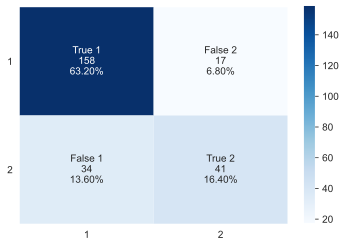

In [145]:
CM_g = confusion_matrix(Y_g_test, predictions_g)
display_confusion_matrix(CM_g, "german_heat.pdf")

In [146]:
df_mg = calculate_metrics(CM_g)
print_metrics_to_file(df_mg, 'german_metrics.tex')
display(df_mg)

,metrics,value
0,Accuracy,0.796


Результаты в случае удаления избыточного количества примеров мажоритарного класса $X_1$ (random undersampling):

In [158]:
X_1 = X_1.sample(n = 300)

In [159]:
X_1_train = X_1[:225]
Y_1_train = status[X_1_train.index]
X_1_test = X_1[225:]
Y_1_test = status[X_1_test.index]
X_2_train = X_2[:225]
Y_2_train = status[X_2_train.index]
X_2_test = X_2[225:]
Y_2_test = status[X_2_test.index]
X_g_train = pd.concat([X_1_train, X_2_train])
Y_g_train = pd.concat([Y_1_train, Y_2_train])
X_g_test = pd.concat([X_1_test, X_2_test])
Y_g_test = pd.concat([Y_1_test, Y_2_test])

In [160]:
clf_g = LinearDiscriminantAnalysis(store_covariance=True)
clf_g.fit(X_g_train, Y_g_train)
predictions_g = clf_g.predict(X_g_test)
predictions_g_train_sample = clf_g.predict(X_g_train)

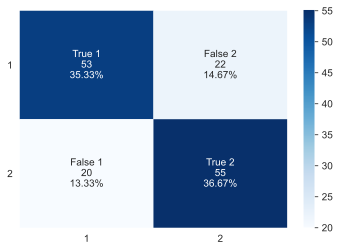

In [161]:
CM_g = confusion_matrix(Y_g_test, predictions_g)
display_confusion_matrix(CM_g, "german_heat_adj.pdf")

In [162]:
df_mg = calculate_metrics(CM_g)
print_metrics_to_file(df_mg, 'german_metrics_adj.tex')
display(df_mg)

,metrics,value
0,Accuracy,0.72
